In [1]:
#Import packages necessary
import pandas as pd
import scanpy as sc
import numpy as np
import squidpy as sq
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys
from scipy.stats import median_abs_deviation as mad
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=300,
    facecolor="white",
    frameon=False,
)


ModuleNotFoundError: No module named 'scanpy'

In [ ]:
# Simply change puck_id to the puck you want to process
puck_id = "Puck_200224_03"

path = f"/share/crsp/lab/mfrose/share/RNAseq/DATA/BS_SlideSeq_EngleRose/Rose lab new reference/{puck_id}"

coor_file = os.path.join(path,f'barcode_matching/{puck_id}_barcode_xy.txt')

In [ ]:
# Setting up the matched barcode and xy coords to later unite with the count matrix
coor_df = pd.read_csv(coor_file, header=None, index_col=0, delimiter='\t')
coor_df.columns = ['xcoord','ycoord']
coor_df.index.name = 'barcode'

In [ ]:
#Confirm sanity check
coor_df

,xcoord,ycoord
barcode,,
GGTTCGTTTNTTTT-1,5287.9,3589.1
GCACATGTTTTTTT-1,4969.4,3410.6
GGAGCGGTTTTTTT-1,5241.8,2954.2
TGCTTGCTTTTTTT-1,3788.9,3849.3
AACCCGCTNTTTTT-1,4792.4,3734.3
...,...,...
ACAACTTGACAAAA-1,4222.4,4022.5
CACATCCGACAAAA-1,2879.6,2740.0
GAGAGAGAACAAAA-1,3357.3,2454.9


In [ ]:
# Sets up the count matrix
mtx = os.path.join(path, f"{puck_id}.matched.digital_expression_matrix.mtx")
feat = os.path.join(path, f"{puck_id}.matched.digital_expression_features.tsv")
barc = os.path.join(path, f"{puck_id}.matched.digital_expression_barcodes.tsv")

expression_matrix = sc.read_mtx(mtx)
expression_matrix = expression_matrix.T
expression_matrix.var_names = pd.read_csv(feat, header=None, sep="\t")[0]
expression_matrix.obs_names = pd.read_csv(barc, header=None)[0]

In [ ]:
#Give real gene names instead of ensembl id
annot = sc.queries.biomart_annotations(
    "mmusculus",
    ["ensembl_gene_id", "external_gene_name"],
).set_index("ensembl_gene_id")

# Filter out missing Ensembl gene IDs from the expression matrix
valid_gene_ids = annot.index.intersection(expression_matrix.var_names)

# Map Ensembl gene IDs to gene names for valid gene IDs
expression_matrix.var["external_gene_name"] = pd.Series(index=valid_gene_ids, data=annot.loc[valid_gene_ids, "external_gene_name"].values)

# Filter out the remaining missing gene IDs from the expression matrix
missing_gene_ids = expression_matrix.var_names.difference(valid_gene_ids)
expression_matrix = expression_matrix[:, ~expression_matrix.var_names.isin(missing_gene_ids)]

In [ ]:
# Creates the AnnData object
srt = sc.AnnData(X=expression_matrix.X)
srt.obs_names = expression_matrix.obs_names
srt.var_names = expression_matrix.var['external_gene_name']

# Index is previously unnamed so we need to assign it the same string as the coor_df index for later merge
srt.obs.index.name = 'barcode'

# Scanpy will explode if the below is not ran...
srt.var_names = srt.var_names.astype(str)
srt.var_names_make_unique()

In [ ]:
#Confirm AnnData Object
srt

AnnData object with n_obs × n_vars = 42293 × 26124

In [ ]:
# Here we unite the coordinates with the barcodes in srt and store the values in the objects meta data
NEWcoor_df = coor_df.loc[srt.obs_names, ['xcoord', 'ycoord']]
srt.obsm['spatial'] = NEWcoor_df.to_numpy()

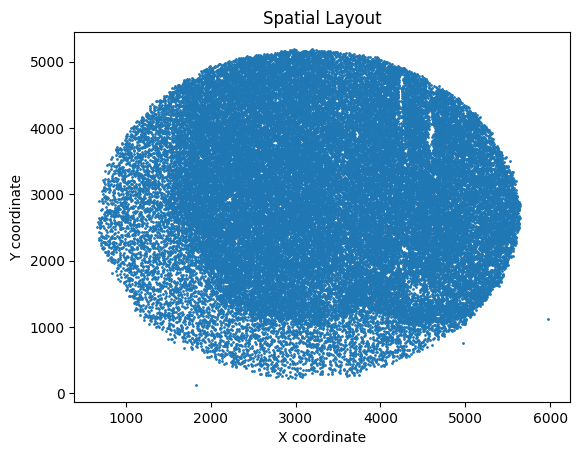

In [ ]:
# Visualize spatial coordinates
x, y = srt.obsm["spatial"][:, 0], srt.obsm["spatial"][:, 1]
plt.scatter(x, y, s=1)
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.title("Spatial Layout")
plt.show()

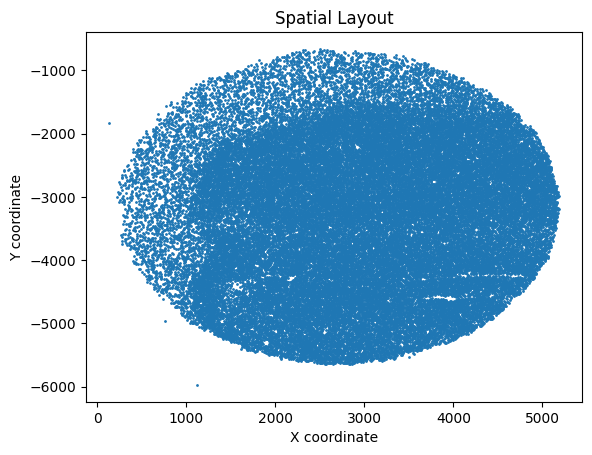

In [ ]:
#Rotate IF NEEDED, every rotation is a counter clock wise 90 degree rotation

import numpy as np

# Access the spatial coordinates
spatial_coords = srt.obsm['spatial']

# Define the rotation matrix for a 90-degree counterclockwise rotation
rotation_matrix = np.array([[0, -1],
                            [1,  0]])

# Apply the rotation
rotated_coords = np.dot(spatial_coords, rotation_matrix.T)

# Update the spatial coordinates in the AnnData object
srt.obsm['spatial'] = rotated_coords

x, y = srt.obsm["spatial"][:, 0], srt.obsm["spatial"][:, 1]
plt.scatter(x, y, s=1)
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.title("Spatial Layout")
plt.show()

In [ ]:
# Filtering stray beads
sc.pp.filter_cells(srt, min_counts=1)
sc.pp.filter_cells(srt, min_genes=1)

In [ ]:
# Mito genes
srt.var["mt"] = srt.var_names.str.startswith("mt-")
# ribosomal genes
srt.var["ribo"] = srt.var_names.str.startswith(("Rps", "Rpl"))
# hemoglobin genes
srt.var["hb"] = srt.var_names.str.contains('Hb')
sc.pp.calculate_qc_metrics(
    srt, qc_vars=["mt",'ribo','hb'], inplace=True, log1p=True, percent_top= [20]
)

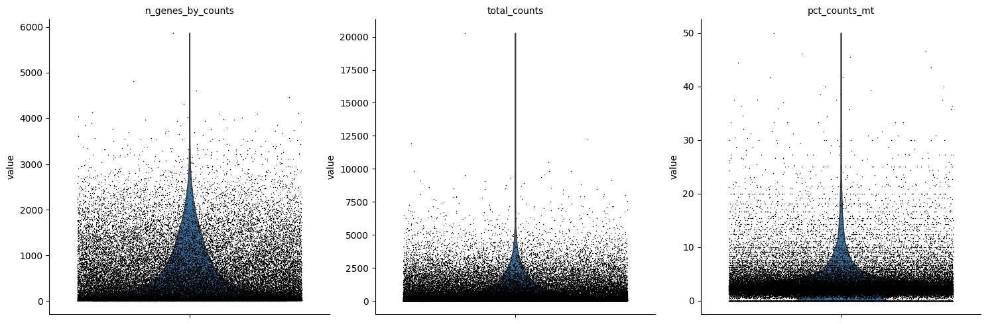

In [ ]:
#Visualize QC metrics
sc.pl.violin(
    srt,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

In [ ]:
#Define MAD function for unsupervised QC
def mad_outlier(adata, metric, nmads, upper_only = False):
    M = adata.obs[metric]
    
    if not upper_only:
        return (M < np.median(M) - nmads * mad(M)) | (M > np.median(M) + nmads * mad(M))
    
    return (M > np.median(M) + nmads * mad(M))

In [ ]:
#Define function to call MAD function, parameter is # of std deviation
def auto_QC(adata):
            outliers = mad_outlier(adata, 'log1p_total_counts', 5) +\
            mad_outlier(adata, 'log1p_n_genes_by_counts', 5) +\
            mad_outlier(adata, 'pct_counts_in_top_20_genes', 5) +\
            mad_outlier(adata, 'pct_counts_mt', 3, upper_only= True)
            adata = adata[~outliers]               
            return adata

In [ ]:
#Call QC function
srt = auto_QC(srt) 

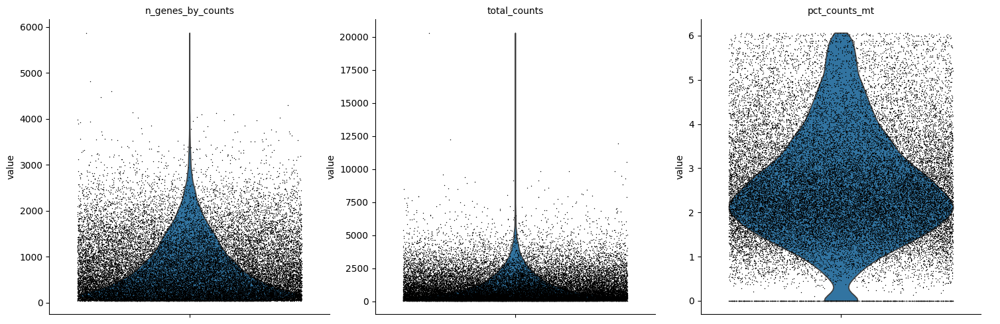

In [ ]:
#Visualize After QC
sc.pl.violin(
    srt,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

<Axes: title={'center': 'SCANPY'}, xlabel='spatial1', ylabel='spatial2'>

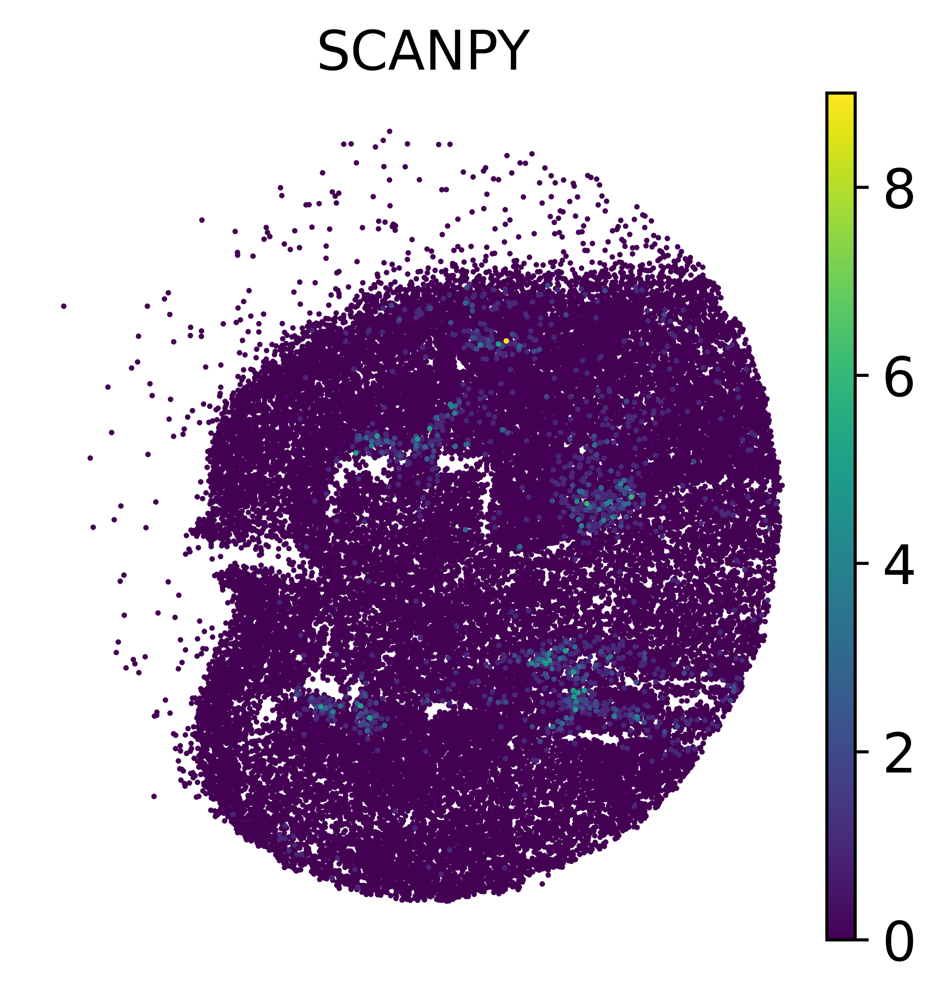

In [ ]:
sc.pl.embedding(srt, basis="spatial", color=["Isl1"],s=8, show=False, title='SCANPY')


In [ ]:
#Always save raw counts to '.layers' anything done to .X "the active matrix" will be overwritten
srt.layers['counts'] = srt.X.copy()


/tmp/nshiroon/35722622/ipykernel_3953950/1092976323.py:2: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  srt.layers['counts'] = srt.X.copy()


In [ ]:
#Standard Downstream
srt.X = srt.layers['counts'].copy()
sc.pp.normalize_total(srt, inplace=True, target_sum = 1e4)
sc.pp.log1p(srt)
#Consider playing around with n_top_genes dependent on latent variable spread 
sc.pp.highly_variable_genes(srt, flavor="seurat_v3", n_top_genes=5000, layer = 'counts')
sc.pp.pca(srt, n_comps = 50)
sc.pp.neighbors(srt)
sc.tl.umap(srt)
sc.tl.leiden(
    srt, key_added="leiden", flavor="igraph", directed=False, n_iterations=2
)

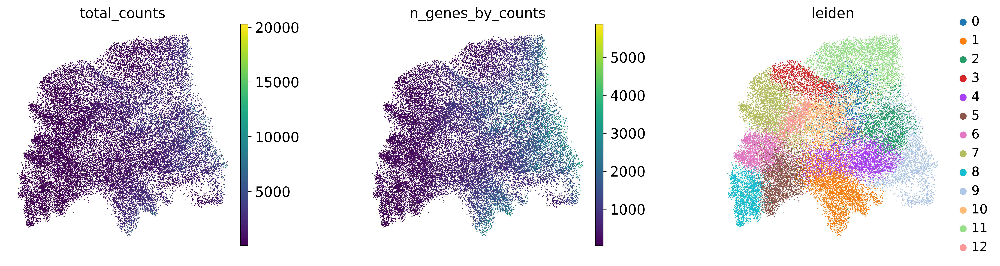

In [ ]:
#Visualize QC_metrics on UMAP (non-spatial)
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(srt, color=["total_counts", "n_genes_by_counts", "leiden"], wspace=0.4)

<Axes: title={'center': 'SCANPY'}, xlabel='spatial1', ylabel='spatial2'>

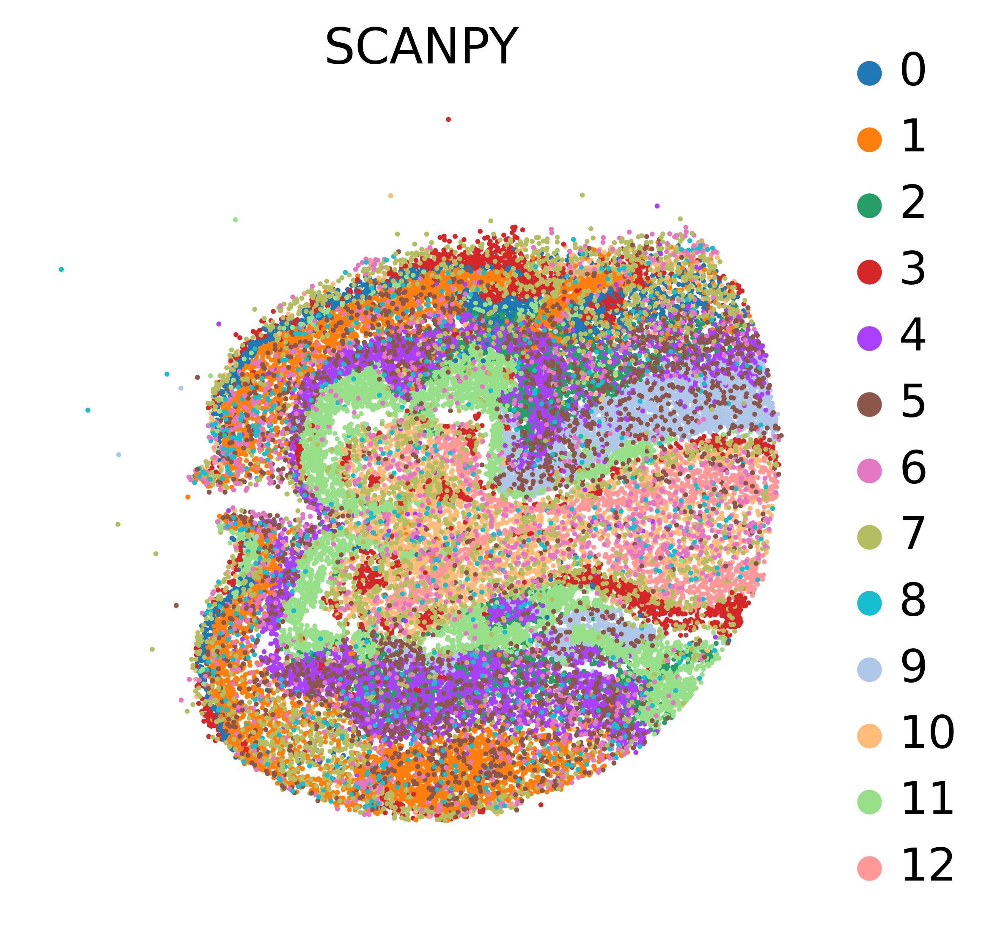

In [ ]:
#Visualize leiden clusters on Spatial map
sc.pl.embedding(srt, basis="spatial", color=["leiden"],s=8, show=False, title='SCANPY')


In [ ]:
#Save intermediate output for further QC
srt.write('/share/crsp/lab/mfrose/share/RNAseq/DATA/intermediate_clean_data/slide_seq/Puck_03.h5ad')